# Tratamiento de imágenes - 2024 - Entregable 3

# Fecha de entrega: 09/6/2024

### Importante:   
**En todos los ejercicios se espera que se presente un breve contexto teórico y se  hagan comentarios sobre decisiones tomadas en la implementación así como un análisis de los resultados. Estos comentarios y análisis se pueden entregar en secciones agregadas al notebook o en un informe aparte agregado al notebook.**   

**El notebook entregado debe tener guardados los resultados de su ejecución.**

In [1]:
import os
import cv2
import random
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from skimage.io import imread, imsave
from skimage.feature import graycomatrix, graycoprops
from tabulate import tabulate
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.inspection import DecisionBoundaryDisplay

# FORMAS DE VER LAS GRAFICAS --------------------
# ELEGIR UNA DE LAS OPCIONES Y DES-COMENTAR (sacar # de la linea)
# ----------------
# a) graficas en línea  entre las celdas (no interactivo)
%matplotlib inline
# ----------------
# b) graficas en línea  entre las celdas (interactivo)
# %matplotlib notebook
# ----------------
# c) graficas en ventanas externas (abre una ventana por cada figura)
# %matplotlib
# ----------------
# d) Si se usa "jupyter lab" en lugar de "jupyter notebook" usar %matplotlib widget en lugar de %matplotlib notebook
# requiere instalar el modulo "ipympl". Ver https://stackoverflow.com/questions/51922480/javascript-error-ipython-is-not-defined-in-jupyterlab#56416229
# %matplotlib widget
#---------------------------------------------------



# Directorio con la base de imágenes de prueba (las que están en la web de Timag)
# Ej. si usan la imagen trapo.jpg en el notebook no tienen que subirla al eva
# La llaman en el notebook en forma relativa a donde tengan esas imagenes:
#
# filename = os.path.join(dir_base_imagenes, 'trapo.jpg')
# I = imread(filename)
dir_base_imagenes = './imagenes'

## 1. Clasificación de texturas

Se usará la base de datos
G. Kylberg. The Kylberg Texture Dataset v. 1.0, Centre for Image Analysis,
Swedish University of Agricultural Sciences and Uppsala University,
External report (Blue series) No. 35.  
Disponible en: http://www.cb.uu.se/~gustaf/texture/  
Bajar la versión reducida de la base (6 clases, 40 muestras por clase, ~50 MB)

### 1.1 Calcular descriptores de textura


#### Calcular descriptores sobre el histograma de niveles de gris

In [2]:
def nth_central_moment(p, m, n):
    return np.sum([(i - m)**n * p[i] for i in range(len(p))])

def calcular_descriptores_de_histograma(I):
    '''
    Calcula el histograma normalizado de la imagen I.
    Devuelve descriptores sobre el histograma calculado

    Parameters
    ----------
    I : imagen de 256 niveles de gris (uint8)

    Returns
    -------
    mean : double
    R : double
    skewness : double
    flatness : double
    uniformity : double
    entropy : double

    '''

    # calcular el histograma normalizado
    numBins = 256
    histograma, bin_edges = np.histogram(I[:], np.arange(numBins+1), density=True)

    # descriptores
    mean = np.sum([histograma[i]*i for i in range(len(histograma))])
    variance = nth_central_moment(histograma, mean, n=2)
    R = 1 - 1/(1+variance)
    skewness = nth_central_moment(histograma, mean, n=3)
    flatness = nth_central_moment(histograma, mean, n=4)
    uniformity = np.sum([histograma[i]**2 for i in range(len(histograma))])
    entropy = - np.sum([histograma[i]*np.log2(histograma[i]) if histograma[i] > 0 else 0 for i in range(len(histograma))])

    return mean, R, skewness, flatness, uniformity, entropy

#### Calcular descriptores sobre la matriz de coocurrencia   
Para la implementación se usarán funciones adecuadas de   
https://scikit-image.org/docs/stable/api/skimage.feature.html

In [3]:
def calcular_descriptores_de_matriz_de_coocurrencia(I, distance, angle, levels=256, debug=False):
    '''
    Calcula la matriz de coocurrencia NORMALIZADA para la imagen I
    para la combinación (distancia, angulo) deseado
    Devuelve descriptores sobre la matriz de coocurrencia calculada
    Se implementa con funciones adecuadas de:
        skimage.feature

    Parameters
    ----------
    I : imagen de 256 niveles de gris (uint8)
    distance : int, optional
        Distancia entre pixeles para calcular la coocurrencia.
    angle : double, optional
        Angulo (en radianes con respecto a la horizontal) para calcular la coocurrencia.
    levels : int, optional . Por defecto 256.
        Usar solo para debuggear en imagenes artificiales pequeñas
    debug: bool, optional
        En caso de ser verdadero, imprime la matriz de coocurrencia
    Returns
    -------
    contrast : double
    dissimilarity : double
    homogeneity : double
    energy : double
    correlation : double

    '''

    matriz_coocurrencia = graycomatrix(I, [distance], [angle], levels=levels)
    if debug:
        print("Matriz de coocurrencia: \n", matriz_coocurrencia[:, :, 0, 0])
    contrast = graycoprops(matriz_coocurrencia, 'contrast')[0][0]
    dissimilarity = graycoprops(matriz_coocurrencia, 'dissimilarity')[0][0]
    homogeneity = graycoprops(matriz_coocurrencia, 'homogeneity')[0][0]
    energy = graycoprops(matriz_coocurrencia, 'energy')[0][0]
    correlation = graycoprops(matriz_coocurrencia, 'correlation')[0][0]

    return contrast, dissimilarity, homogeneity, energy, correlation


#### Chequear cálculo de descriptores sobre la matriz de coocurrencia
Chequear que la matriz de coocurrencia y los descriptores estén bien calculados sobre un caso sencillo con 4 niveles

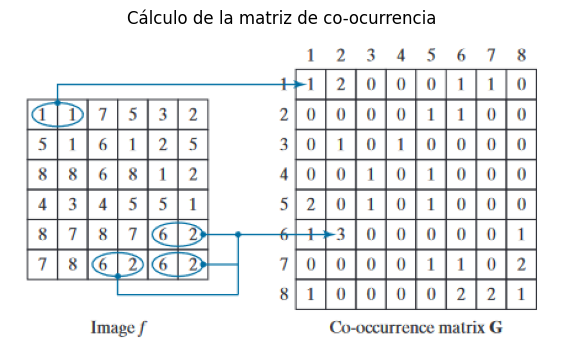

In [4]:
cooccurrence_matrix = imread(dir_base_imagenes+'/cooccurrence_matrix.png')
plt.figure(figsize = (7,7))
plt.title('Cálculo de la matriz de co-ocurrencia')
plt.imshow(cooccurrence_matrix)
plt.axis('off')
plt.show()

In [5]:
# Ejemplo
image = np.array([[0, 0, 1, 1],
                  [0, 0, 1, 1],
                  [0, 2, 2, 2],
                  [2, 2, 3, 3]], dtype=np.uint8)


print("Descriptores de Histograma: ")
mean, R, skewness, flatness, uniformity, entropy = calcular_descriptores_de_histograma(image)
print("Mean: ", round(mean, 3))
print("R: ", round(R, 3))
print("Skewness: ", round(skewness, 3))
print("Flatness: ", round(flatness, 3))
print("Uniformity: ", round(uniformity, 3))
print("Entropy: ", round(entropy, 3))


print("\n")
print("Distancia 1 horizontal:")
contrast, dissimilarity, homogeneity, energy, correlation=calcular_descriptores_de_matriz_de_coocurrencia(image, 1, 0, levels=4, debug=True)
print(f"Contrast: {round(contrast, 3)}, Dissimilarity: {round(dissimilarity, 3)}, Homogeneity: {round(homogeneity, 3)}, Energy: {round(energy,3)}, Correlation: {round(correlation,3)}")

print("\n")
print("Distancia 1 vertical:")
contrast, dissimilarity, homogeneity, energy, correlation=calcular_descriptores_de_matriz_de_coocurrencia(image, 1, np.pi/2, levels=4, debug=True)
print(f"Contrast: {round(contrast, 3)}, Dissimilarity: {round(dissimilarity, 3)}, Homogeneity: {round(homogeneity, 3)}, Energy: {round(energy,3)}, Correlation: {round(correlation,3)}")

Descriptores de Histograma: 
Mean:  1.25
R:  0.515
Skewness:  0.188
Flatness:  2.035
Uniformity:  0.273
Entropy:  1.924


Distancia 1 horizontal:
Matriz de coocurrencia: 
 [[2 2 1 0]
 [0 2 0 0]
 [0 0 3 1]
 [0 0 0 1]]
Contrast: 0.583, Dissimilarity: 0.417, Homogeneity: 0.808, Energy: 0.408, Correlation: 0.797


Distancia 1 vertical:
Matriz de coocurrencia: 
 [[3 0 2 0]
 [0 2 2 0]
 [0 0 1 2]
 [0 0 0 0]]
Contrast: 1.0, Dissimilarity: 0.667, Homogeneity: 0.7, Energy: 0.425, Correlation: 0.701


#### Calcular descriptores de histograma y de matriz de coocurrencia sobre imágenes de la base de texturas.  Mostrar ejemplos para imágenes de las distintas clases

Para la matriz de coocurrencia puede ser conveniente explorar distintas distancias y ángulos


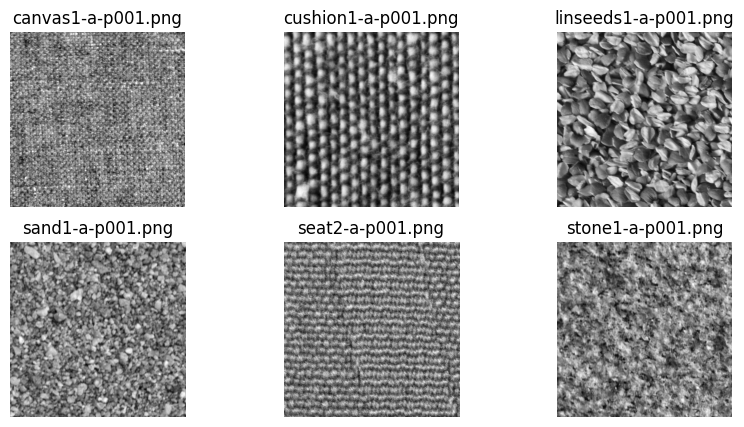

+----------------------+-----------+---------+----------+------------+-------------+--------------+-----------+-----------------+----------------------+--------------------+---------------+--------------------+-------------------+------------------------+----------------------+-----------------+----------------------+
|                      | textura   |    mean |        R |   skewness |    flatness |   uniformity |   entropy |   contrast_50_0 |   dissimilarity_50_0 |   homogeneity_50_0 |   energy_50_0 |   correlation_50_0 |   contrast_50_1.6 |   dissimilarity_50_1.6 |   homogeneity_50_1.6 |   energy_50_1.6 |   correlation_50_1.6 |
|----------------------+-----------+---------+----------+------------+-------------+--------------+-----------+-----------------+----------------------+--------------------+---------------+--------------------+-------------------+------------------------+----------------------+-----------------+----------------------|
| canvas1-a-p001.png   | canvas1   | 126

In [6]:
imagenes = []
nombres = []
texturas = []
for textura in ["canvas1", "cushion1", "linseeds1", "sand1", "seat2", "stone1"]:
    for i in range(1, 41):
        path_img = os.path.join(dir_base_imagenes, f"{textura}/{textura}-a-p{i:03d}.png")
        nombres.append(os.path.basename(path_img))
        texturas.append(textura)
        imagen = cv2.imread(path_img, cv2.IMREAD_GRAYSCALE)
        imagenes.append(imagen)

distances = [50, 50]
angles = [0, np.pi/2]

df_texturas = {}
df_texturas["nombre"] = nombres
df_texturas["textura"] = texturas
means, Rs, skewnesses, flatnesses, uniformities, entropies = [], [], [], [], [], []
for imagen in imagenes:
    mean, R, skewness, flatness, uniformity, entropy = calcular_descriptores_de_histograma(imagen)
    means.append(mean)
    Rs.append(R)
    skewnesses.append(skewness)
    flatnesses.append(flatness)
    uniformities.append(uniformity)
    entropies.append(entropy)
df_texturas["mean"] = means
df_texturas["R"] = Rs
df_texturas["skewness"] = skewnesses
df_texturas["flatness"] = flatnesses
df_texturas["uniformity"] = uniformities
df_texturas["entropy"] = entropies
for d, a in zip(distances, angles):
    contrasts, dissimilarities, homogeneities, energies, correlations = [], [], [], [], []
    for imagen in imagenes:
        contrast, dissimilarity, homogeneity, energy, correlation = calcular_descriptores_de_matriz_de_coocurrencia(imagen, d, a)
        contrasts.append(contrast)
        dissimilarities.append(dissimilarity)
        homogeneities.append(homogeneity)
        energies.append(energy)
        correlations.append(correlation)
    df_texturas[f"contrast_{d}_{round(a,1)}"] = contrasts
    df_texturas[f"dissimilarity_{d}_{round(a,1)}"] = dissimilarities
    df_texturas[f"homogeneity_{d}_{round(a,1)}"] = homogeneities
    df_texturas[f"energy_{d}_{round(a,1)}"] = energies
    df_texturas[f"correlation_{d}_{round(a,1)}"] = correlations

df_texturas = pd.DataFrame(df_texturas, columns=df_texturas.keys())
df_texturas.set_index("nombre", inplace=True)

fig, axes = plt.subplots(2, 3, figsize=(10, 5))
axes = axes.flatten()
for imagen, ax, nombre in zip(imagenes[::40], axes, list(df_texturas.index)[::40]):
    ax.imshow(imagen, cmap="gray")
    ax.set_title(nombre)
    ax.axis("off")
plt.show()

print(tabulate(df_texturas.groupby("textura").head(2), headers=df_texturas.keys(), tablefmt='psql'))

### 1.2. Ver si algunos de los descriptores calculados permiten discriminar las texturas


#### Analizar gráficamente:  Considerar pares de descriptores. Graficar los valores para las imágenes de la base y ver si se separan las clases. 
Puede ser conveniente para esto explorar:  https://seaborn.pydata.org/generated/seaborn.pairplot.html


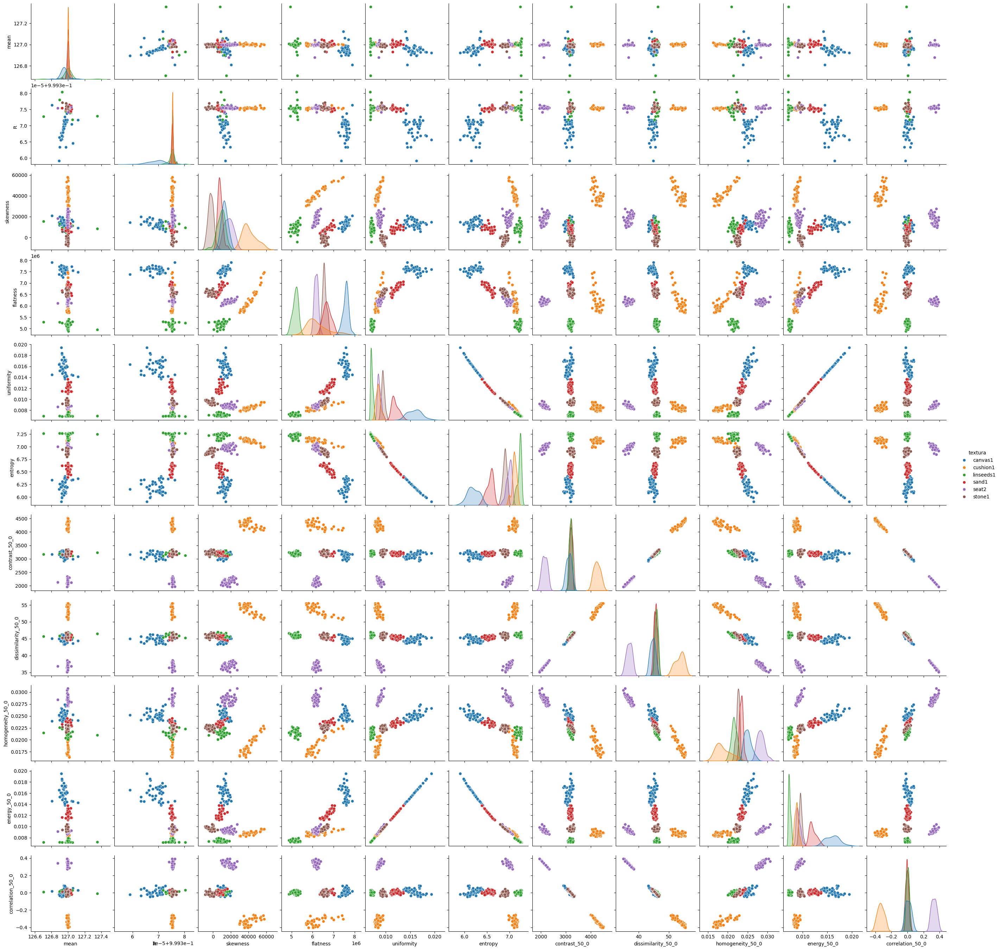

In [7]:
sns.pairplot(df_texturas.drop(df_texturas.columns[-5:], axis=1), hue="textura")

####  ¿Existen descriptores que permiten discriminar las texturas de la base? En caso afirmativo, muestre cuáles se podrían usar. 

Si, hay pares de descriptores que permiten discriminar las texturas, por ejemplo entropy y correlation_50_0 donde 50 es la distancia y 0 es el angulo utilizado para el calculo de matriz de coocurrencia. En el siguiente ejercicio se implementara un clasificador para predecir la textura a partir de solo estas dos features

### 1.3. Implementar un clasificador de K vecinos más cercanos   
Ver:  
https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html  

https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html  
  
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html  
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html


a) Partir la base de imágenes en 2. De cada clase se usarán 20 imágenes para entrenamiento (conjunto de train) y se usarán las otras 20 imágenes para evaluar el clasificador (conjunto de test)        
b) Calcular sobre todas las imágenes de la base (train y test) las 2 características más relevantes (dos descriptores que se consideren buenos del paso (2) del ejercicio)   
Se armarán los arrays:    
* **X_train**:  array de tamaño (cantidad_imagenes_de_la_base/2, 2) donde cada fila tiene las características de una cierta imagen del conjunto de entrenamiento   
* **X_test**:  array de tamaño (cantidad_imagenes_de_la_base/2, 2) donde cada fila tiene las características de una cierta imagen del conjunto de test
* **y_train**: array de tamaño (cantidad_imagenes_de_la_base/2, 1) donde cada fila tiene la clase a la que corresponde una cierta imagen del conjunto de entrenamiento
* **y_test**: array de tamaño (cantidad_imagenes_de_la_base/2, 1) donde cada fila tiene la clase a la que corresponde una cierta imagen del conjunto de test    

c) Crear un clasificador de K vecinos más cercanos (considerar K entre 2 y 5)   
d) Entrenar con el conjunto de entrenamiento   
e) Evaluar el funcionamiento sobre el conjunto de test. 
* Mostrar la tasa de aciertos
* Mostrar la matriz de confusion de clases



Accuracy en test: 1.0


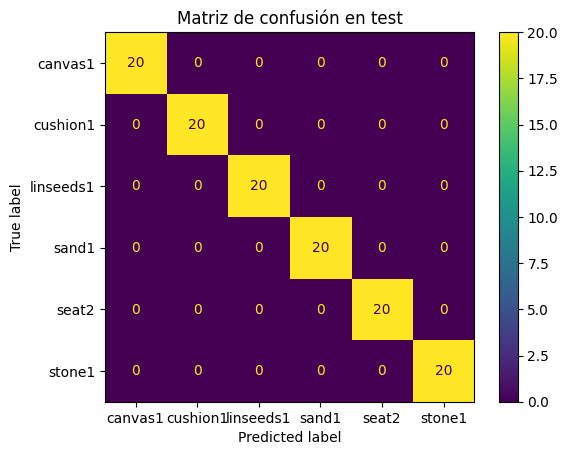

/tmp/ipykernel_14578/3005549981.py:36: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_test[y_test == label].to_numpy()[:, 0], X_test[y_test == label].to_numpy()[:, 1], label=label, cmap=cmap, edgecolor="black")


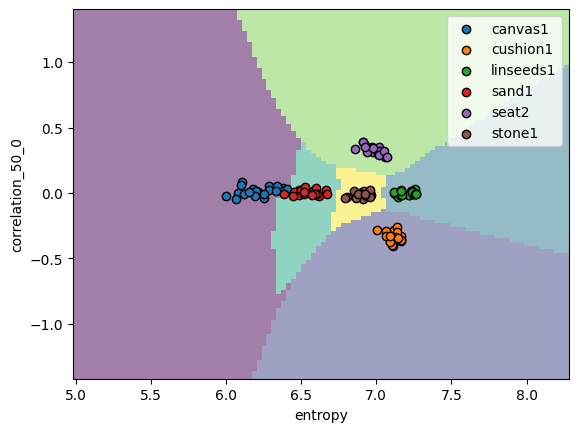

In [8]:
X = df_texturas[['entropy', 'correlation_50_0']]
y = df_texturas['textura']

# Separar conjuntos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, stratify=y, random_state=42)

# Entrenar clasificador
neigh = KNeighborsClassifier(n_neighbors=3)
neigh.fit(X, y)

# Calcular accuray
accuracy = accuracy_score(y_test, y_pred=neigh.predict(X_test))
print(f"Accuracy en test: {accuracy}")

# Matriz de confusion
cm = confusion_matrix(y_test, y_pred=neigh.predict(X_test))
disp = ConfusionMatrixDisplay(cm, display_labels=neigh.classes_)
disp.plot()
plt.title("Matriz de confusión en test")
plt.show()

# Ploteo de frontera de decision
fig, ax = plt.subplots(1, 1)
disp = DecisionBoundaryDisplay.from_estimator(
    neigh,
    X_test,
    response_method="predict",
    plot_method="pcolormesh",
    shading="auto",
    alpha=0.5,
    ax=ax,
)
labels, y_test_encoded = np.unique(y_test, return_inverse=True)
cmap = plt.get_cmap('viridis', len(labels))
for i, label in enumerate(labels):
    plt.scatter(X_test[y_test == label].to_numpy()[:, 0], X_test[y_test == label].to_numpy()[:, 1], label=label, cmap=cmap, edgecolor="black")
plt.legend()
plt.show()

## 2 Detección y matching de puntos SIFT

### 2.1 Escribir un programa que dadas dos imágenes calcule puntos SIFT y realice el matching de los mismos 
**Implementar mediante funciones de OpenCV**  
Ver:   
https://docs.opencv.org/4.9.0/da/df5/tutorial_py_sift_intro.html   
https://docs.opencv.org/4.9.0/dc/dc3/tutorial_py_matcher.html


**Explicar todos los parámetros de las funciones usadas y el criterio tomado para elegir cada uno de ellos**

In [32]:
def match_sift_keypoints(img1, img2):
    """
    Función que realiza la coincidencia de keypoints entre dos imágenes utilizando SIFT

    Args:
        img1 (np.array): Imagen 1
        img2 (np.array): Imagen 2

    Returns:
        good_matches (list): Lista con los mejores matches
        kp1 (list): Lista de keypoints de la imagen 1
        kp2 (list): Lista de keypoints de la imagen 2
    """

    # Inicializar objeto sift
    sift = cv2.SIFT_create()

    # Obtener keypoints y descriptors
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    # Inicalizar objeto de coincidencia de fuerza bruta (Brute Force Matcher)
    bf = cv2.BFMatcher()

    # Hacer coincidir los descriptores
    matches = bf.knnMatch(des1, des2, k=2)

    # Apply ratio test
    good_matches = []
    for match in matches:
        m, n = match
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

    # Ordenar los matches por distancia
    good_matches = sorted(good_matches, key = lambda x:x.distance)

    return good_matches, kp1, kp2, des1, des2

### 2.2 Mostrar el resultado de detectar y matchear para las imágenes "peppers_dark" y "peppers_rotada"   
**a) Mostrar gráficamente los matches   
b) Para el match más fuerte, mostrar los puntos en las imágenes, junto a su escala y ángulo. Analizar sus histogramas de orientaciones locales.    
c) Algunos de los matches son erroneos (los puntos matcheados no corresponden a la misma zona de la imagen). Analizar, como en (b) alguno de estos matches erroneos.**

Puede ser útil el artículo [Anatomy of the SIFT Method](https://www.ipol.im/pub/art/2014/82/) para interpretar los descriptores de SIFT.

a)

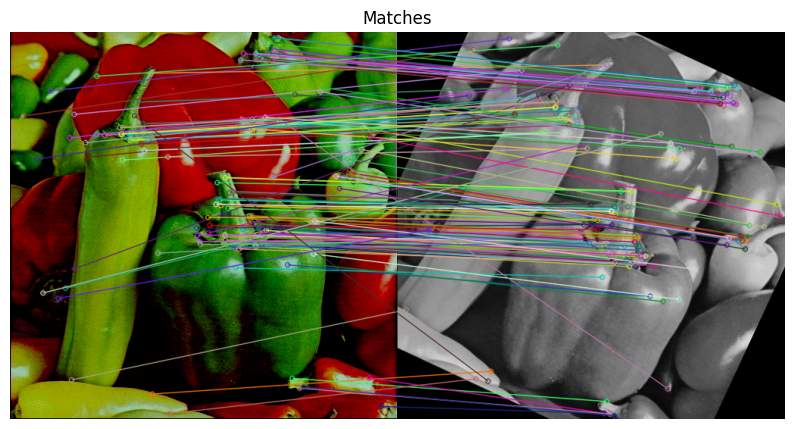

In [34]:
img1 = cv2.imread(os.path.join(dir_base_imagenes, 'peppers_dark.png'))
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread(os.path.join(dir_base_imagenes, 'peppers_rotada.png'), cv2.IMREAD_GRAYSCALE)

matches, kp1, kp2, des1, des2 = match_sift_keypoints(img1, img2)

img3 = cv2.drawMatchesKnn(img1, kp1, img2, kp2, [matches], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)


plt.figure(figsize=(10, 10))
plt.imshow(img3)
plt.axis('off')
plt.title('Matches')
plt.show()


b) La escala de un keypoint refiere a la desviación estándar del filtro Gaussiano utilizado para detectar el punto característico, mientras que el angulo es la dirección dominante de los gradientes locales alrededor de ese punto. Ambos atributos de los keypoints se utilizan para comparar los puntos.

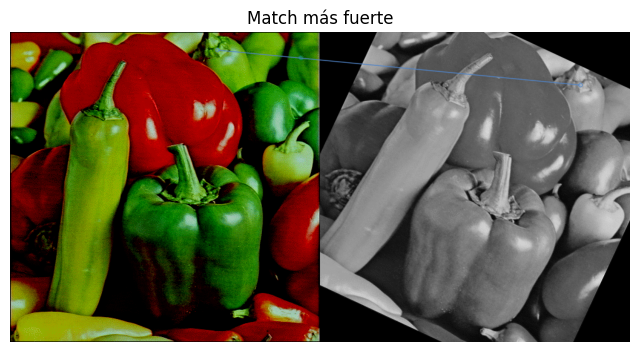

Escala query: 4.088677406311035
Angulo query: 82.81324768066406
Escala train: 4.2611613273620605
Angulo  train: 106.34475708007812


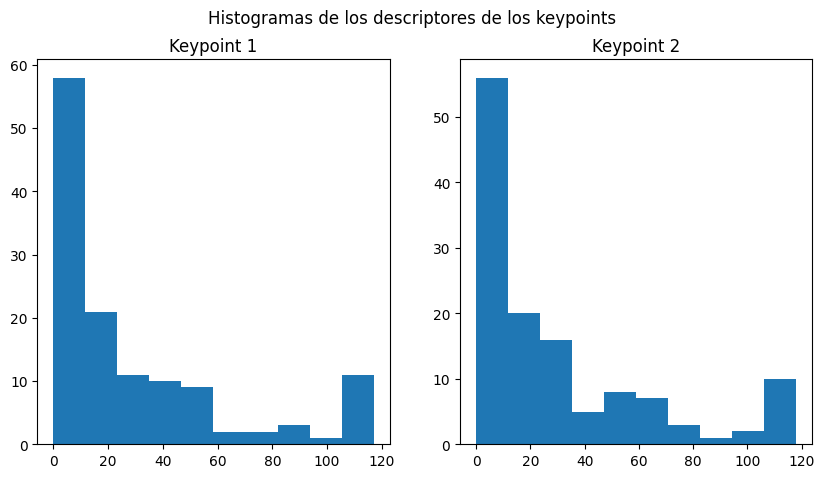

In [35]:
# Mostrar match mas fuerte
img3 = cv2.drawMatchesKnn(img1, kp1, img2, kp2, [[matches[0]]], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(8,8))
plt.title("Match más fuerte")
plt.imshow(img3)
plt.axis('off')
plt.show()

query_idx = matches[0].queryIdx
train_idx = matches[0].trainIdx

kp1_match = kp1[query_idx]
kp2_match = kp2[train_idx]

hist1 = des1[query_idx]
hist2 = des2[train_idx]

scale1 = kp1_match.size
angle1 = kp1_match.angle
scale2 = kp2_match.size
angle2 = kp2_match.angle
print("Escala query:", scale1)
print("Angulo query:", angle1)
print("Escala train:", scale2)
print("Angulo  train:", angle2)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].hist(hist1)
ax[0].set_title("Keypoint 1")
ax[1].hist(hist2)
ax[1].set_title("Keypoint 2")
plt.suptitle("Histogramas de los descriptores de los keypoints")
plt.show()



Se logra ver que ambos puntos tienen escala similar, y ángulo con una diferencia de 25 grados apróximadamente, lo que es coherente pues la segunda imagen esta rotada. 
Los histogramas se logra ver que son similares

c) Para un match erroneo:

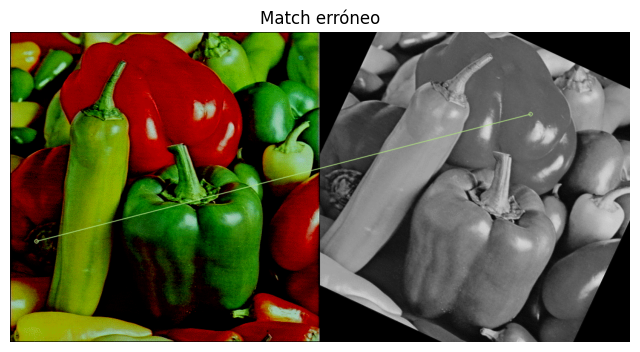

Escala query: 2.265486001968384
Angulo query: 19.28913116455078
Escala train: 1.844538927078247
Angulo  train: 188.8961944580078


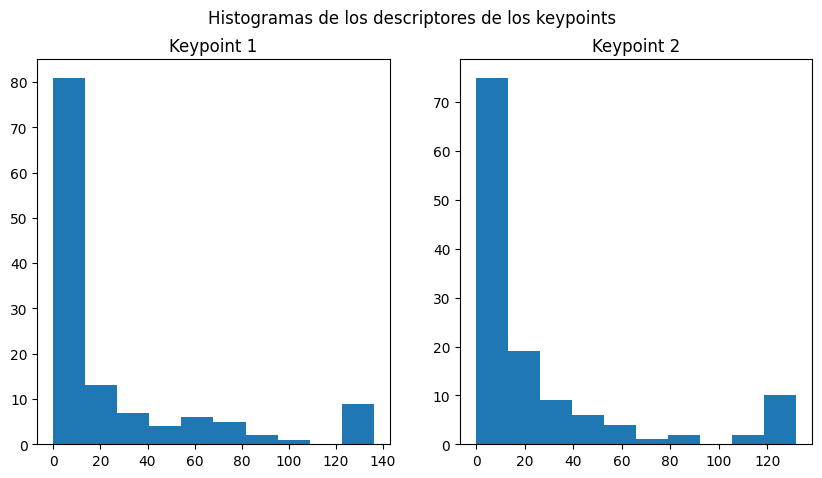

In [36]:
# Mostrar match erróneo
img3 = cv2.drawMatchesKnn(img1, kp1, img2, kp2, [[matches[-10]]], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(8,8))
plt.title("Match erróneo")
plt.imshow(img3)
plt.axis('off')
plt.show()

query_idx = matches[-10].queryIdx
train_idx = matches[-10].trainIdx

kp1_match = kp1[query_idx]
kp2_match = kp2[train_idx]

hist1 = des1[query_idx]
hist2 = des2[train_idx]

scale1 = kp1_match.size
angle1 = kp1_match.angle
scale2 = kp2_match.size
angle2 = kp2_match.angle
print("Escala query:", scale1)
print("Angulo query:", angle1)
print("Escala train:", scale2)
print("Angulo  train:", angle2)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].hist(hist1)
ax[0].set_title("Keypoint 1")
ax[1].hist(hist2)
ax[1].set_title("Keypoint 2")
plt.suptitle("Histogramas de los descriptores de los keypoints")
plt.show()


Se logra visualizar una discrepancia notoria en los ángulos de los keypoints. Sin embargo, los histogramas de los descriptores se ven similares, lo que es esperable ya que es lo que utiliza el algoritmo para identificarlos como match.

### 2.3 Estimar, de forma robusta, la homografía entre las imágenes a partir de los matches  

A partir de la correspondencia entre puntos característicos, es posible determinar la transformación plana que relaciona las dos imágenes pero, como se vio en 2.2, no hay garantía que todas las correspondencias del matching sean buenas. Es necesario entonces estimar la homografía de forma robusta reconociendo cuáles son las correspondencias buenas (las llamaremos inliers) y descartando las malas (que llamaremos outliers).    
El cálculo robusto de la homografía se implementará mediante RANSAC.    

Para esta parte puede ser interesante ver las secciones 4.7 y 4.8 del libro:    
Multiple View Geometry in Computer Vision (Second Edition)    
Richard Hartley and Andrew Zisserman, Cambridge University Press, March 2004.    
https://www.robots.ox.ac.uk/~vgg/hzbook/



   
**Investigar RANSAC.    
Explicar la idea general de RANSAC y su aplicación para la estimación robusta de una homografía** 

La idea general de RANSAC es realizar un ajuste robusto de un modelo a los datos, a pesar de la presencia de outliers.
Esto se logra mediante la selección aleatoria de subconjuntos de datos y la estimación del modelo correspondiente a cada subconjunto. Luego, se evalúa cuántos puntos del conjunto de datos total se ajustan aceptablemente al modelo estimado (inliers). Este proceso se repite varias veces y se selecciona el modelo que tenga el mayor número de inliers.

En el caso específico de la estimación de una homografía, que es una transformación geométrica utilizada para mapear puntos de una imagen a otra, se realiza lo siguiente. 

Se parte de tener puntos de origen y puntos de destino (los cuales pueden contener outliers).
De ese conjunto de datos, se selecciona aleatoriamente un subconjunto de estos, con ese subconjunto se estima la homografía.
Para cada punto del conjunto total de datos, se calcula una medida de error entre el punto origen transformado por dicha homografía estimada y el punto destino, y si dicho error es menor que cierto umbral se lo identifica como punto inlier. Se cuenta la cantidad de inliers para dicha homografía. Luego, se sortea aleatoriamente otro subconjunto de los datos y se repite el proceso. La idea es identificar el sorteo en el cual se logró el mayor número de inliers y quedarse con esa estimación de la homografía

#### Implementar la estimación de una homografía usando RANSAC

*Nota*: implementar con código propio. En caso de duda consultar qué herramientas se pueden usar y cuáles no.

In [13]:
def estimar_homografia_con_ransac(puntos_ori, puntos_dst, iteraciones, umbral_distancia):
    '''
    Estima una homografia usando RANSAC

    Parameters
    ----------
    puntos_ori : array Nx2 de coordenadas de puntos
        Puntos origen.
    puntos_dst : array Nx2 de coordenadas de puntos
        Puntos destino.
    iteraciones : int
        Cantidad de repeticiones del muestreo y calculo de posibles homografias.
    umbral_distancia : double
        Umbral para evaluar la distancia entre un punto destino y su
        correspondiente proyectado por la homografia en evaluacion.

    Returns
    -------
    H : array 3x3
        Homografia estimada.
    indices_inliers : array
        Lista de los indices que resultaron inliers de H.
    indices_outliers : array
        Lista de los indices que resultaron outliers de H.

    '''
    
    random.seed(42)

    num_puntos = puntos_ori.shape[0]
    max_inliers_encontrados = 0
    indices_inliers_best, indices_outliers_best = [], []

    for _ in range(iteraciones):
        # Selecciono 4 puntos aleatorios de los datos
        indices_muestra = random.sample(range(num_puntos), 4)
        muestra_origen = puntos_ori[indices_muestra]
        muestra_destino = puntos_dst[indices_muestra]

        # calculo homografia (H)
        H_actual , _ = cv2.findHomography(muestra_origen, muestra_destino)
        
        if H_actual is not None:
            # transformo puntos_ori a traves de H
            inliers_actual, outliers_actual = [], []
            for i in range(num_puntos):
                # coordenas homogeneas
                punto = np.array([puntos_ori[i][0], puntos_ori[i][1], 1])

                # transformo
                punto_transformado = H_actual @ (punto.T)

                if punto_transformado[2] != 0:
                    # coordenadas cartesianas
                    punto_transformado = [punto_transformado[0]/punto_transformado[2], punto_transformado[1]/punto_transformado[2]]
                    

                    # distancia entre punto transformado y punto destino
                    distancia = np.linalg.norm(punto_transformado - puntos_dst[i])

                    # si distancia < umbral: es inlier
                    # si distancia > umbral: es outlier
                    if distancia < umbral_distancia:
                        inliers_actual.append(i)
                    else:
                        outliers_actual.append(i)
                    
            num_inliers = len(inliers_actual)

            # me quedo con el caso de mayor cantidad de inliers
            if num_inliers > max_inliers_encontrados:
                H = H_actual
                indices_inliers_best = inliers_actual
                indices_outliers_best = outliers_actual

                max_inliers_encontrados = num_inliers

    return H, indices_inliers_best, indices_outliers_best

#### Estimar la homografía para las correspondencias encontradas entre las imágenes "peppers_dark" y "peppers_rotada"   
**a) Mostrar los resultados numéricos (H,cantidad de inliers y outliers, etc.)   
b) Mostrar gráficamente las correspondencias inliers y outliers** 

H:
[[ 9.11168776e-01 -4.18341318e-01  1.31223031e+02]
 [ 4.25964333e-01  9.11526981e-01 -8.51917918e+01]
 [ 5.25349617e-06  1.20147793e-05  1.00000000e+00]]

Cantidad de inliers: 133
Cantidad de outliers: 13

Inliers:


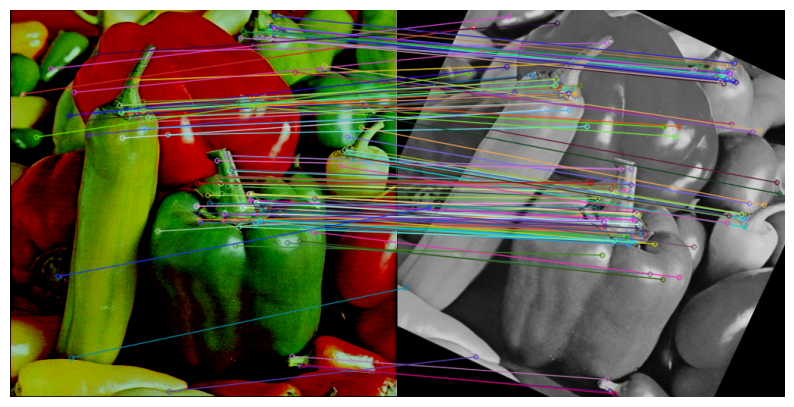

Outliers:


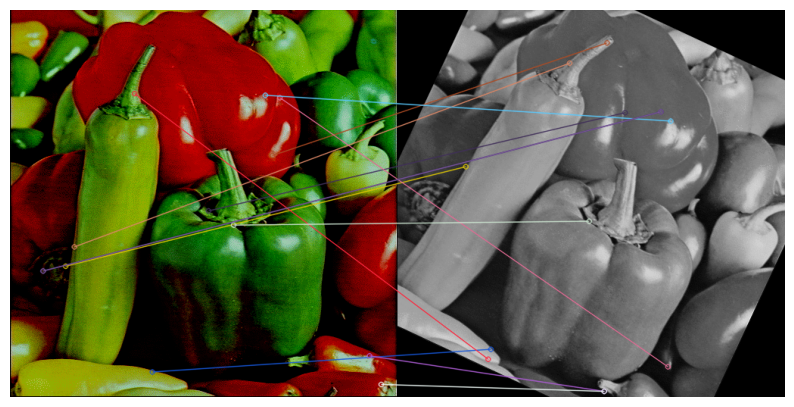

In [38]:
img1 = cv2.imread(os.path.join(dir_base_imagenes, 'peppers_dark.png'))
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread(os.path.join(dir_base_imagenes, 'peppers_rotada.png'), cv2.IMREAD_GRAYSCALE)

matches, kp1, kp2, _, _ = match_sift_keypoints(img1, img2)

puntos_origen = np.empty((len(matches), 2))
puntos_destino = np.empty((len(matches), 2))
for i, match in enumerate(matches):
    query_idx = match.queryIdx
    train_idx = match.trainIdx

    query_kp = kp1[query_idx]
    train_kp = kp2[train_idx]

    puntos_origen[i, 0] = query_kp.pt[0]
    puntos_origen[i, 1] = query_kp.pt[1]
    puntos_destino[i, 0] = train_kp.pt[0]
    puntos_destino[i, 1] = train_kp.pt[1]

H, indices_inliers, indices_outliers = estimar_homografia_con_ransac(puntos_origen, puntos_destino, 1000, umbral_distancia=12)

print("H:")
print(H)
print()
print("Cantidad de inliers:", len(indices_inliers))
print("Cantidad de outliers:", len(indices_outliers))
print()

matches_inliers = [matches[i] for i in indices_inliers]
matches_outliers = [matches[i] for i in indices_outliers]

print("Inliers:")
img3 = cv2.drawMatchesKnn(img1, kp1, img2, kp2, [matches_inliers], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(10, 10))
plt.imshow(img3)
plt.axis('off')
plt.show()

print("Outliers:")
img4 = cv2.drawMatchesKnn(img1, kp1, img2, kp2, [matches_outliers], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(10, 10))
plt.imshow(img4)
plt.axis('off')
plt.show()

Para verificar que se logró estimar la homografía correctamente, voy a transformar la imagen de entrada y visualizar que queda similar a la imagen de salida

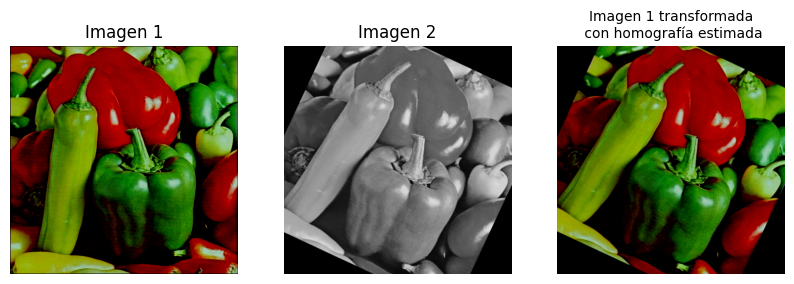

In [40]:
img1_transformada = cv2.warpPerspective(img1, H, (img2.shape[0], img2.shape[1]))

fig, ax = plt.subplots(1, 3, figsize=(10,4))
ax[0].imshow(img1)
ax[0].axis("off")
ax[0].set_title("Imagen 1")
ax[1].imshow(img2 , cmap='gray')
ax[1].axis("off")
ax[1].set_title("Imagen 2")
ax[2].imshow(img1_transformada)
ax[2].axis("off")
ax[2].set_title("Imagen 1 transformada\n con homografía estimada", fontsize=10)
plt.show()

### 2.4 Aplicación: Reconocimiento automático de productos de supermercado

El objetivo es reconocer automáticamente y encontrar la orientación en la imagen de productos de supermercado cuando éstos son mostrados a la cámara utilizando matching de puntos SIFT.   

**Imágenes base**  
Obtener las imágenes de productos en páginas web de supermercados.  Se usarán 4 imágenes base de productos que a su vez tengan en su casa.  

**Imágenes a reconocer**   
Se adquirirán 6 imágenes de cada uno de los productos reales con variación de distancia, orientación y posición.  Se adquirirán además 6 imágenes sin ningún producto.     

A modo de ejemplo se incluyen dos imágenes base de productos e imágenes a reconocer (ver imagenes/productos).

Para los productos a reconocer, se sugiere que tengan un logo o dibujo característico (ocupando una región importante del producto) en una cara aproximadamente plana.


**Se implementará un programa que**, dada una imagen a reconocer:

a) Determine si está presente o no alguno de los productos de las imágenes base  
b) En caso de haber un producto presente en la imágen se debe   
* indicar cuál es el producto 
* estimar la homografía entre producto base y producto real
* mostrar, sobre la imagen a reconocer, el recuadro del producto calculado usando la homografía




In [42]:
nombres_imagenes_base = [
    "cafe_melitta.jpg", 
    "leche_almendras.png", 
    "salsa_gourmet.png", 
    "libro_kiako.png", 
    "libro_bonelli.png",
    "santa_teresa_rosado.png",
    "colet.png",
    "flan.png"
]

In [43]:
def reconocer_producto(path_img):
    """
    Reconoce si un producto es de la base de datos

    Args:
        path_img (str): Path de la imagen a reconocer
    """
    img_a_reconocer = cv2.imread(path_img)
    img_a_reconocer = cv2.cvtColor(img_a_reconocer, cv2.COLOR_BGR2RGB)

    reconocido = False

    for nombre_base in nombres_imagenes_base:
        path_img_base = os.path.join(dir_base_imagenes, f'productos/imagenes_base/{nombre_base}')
        img_base = cv2.imread(path_img_base)
        img_base = cv2.cvtColor(img_base, cv2.COLOR_BGR2RGB)

        matches, kp1, kp2, _, _ = match_sift_keypoints(img_base, img_a_reconocer)
    
        if len(matches) > 120: # condicion empirica que elegi para considerar 
                               # que es un producto de la base de datos
            reconocido = True

            # estimar homografia
            puntos_origen = np.empty((len(matches), 2))
            puntos_destino = np.empty((len(matches), 2))
            for i, match in enumerate(matches):
                query_idx = match.queryIdx
                train_idx = match.trainIdx

                query_kp = kp1[query_idx]
                train_kp = kp2[train_idx]

                puntos_origen[i, 0] = query_kp.pt[0]
                puntos_origen[i, 1] = query_kp.pt[1]
                puntos_destino[i, 0] = train_kp.pt[0]
                puntos_destino[i, 1] = train_kp.pt[1]
            H, _, _ = estimar_homografia_con_ransac(puntos_origen, puntos_destino, 1000, umbral_distancia=12)

            puntos_destino = np.empty((len(matches), 2))

            # bounding box
            h, w, _ = img_base.shape
            puntos_origen = [[0, 0], [0, h], [w, h], [w, 0]]
            puntos_destino = np.empty((4, 2)) 
            for i, punto in enumerate(puntos_origen):
                punto = np.array([punto[0], punto[1], 1])
                punto_transformado = H @ (punto.T)
                puntos_destino[i] = [punto_transformado[0]/punto_transformado[2], punto_transformado[1]/punto_transformado[2]]
            puntos_destino = np.array(puntos_destino, dtype=np.int32)
            img_bb = cv2.polylines(img_a_reconocer.copy(), [puntos_destino], isClosed=True, color=(0, 0, 255), thickness=5)

            fig, ax = plt.subplots(1, 2)
            ax[0].imshow(img_bb)
            ax[0].axis('off')
            ax[1].imshow(img_base)
            ax[1].axis('off')
            plt.suptitle(f"Es un producto de la base de datos! Es {nombre_base.split(".")[0]}")
            plt.show()
        
    if not reconocido:
        plt.figure()
        plt.imshow(img_a_reconocer)
        plt.axis('off')
        plt.title("No se reconoce el producto")
        plt.show()

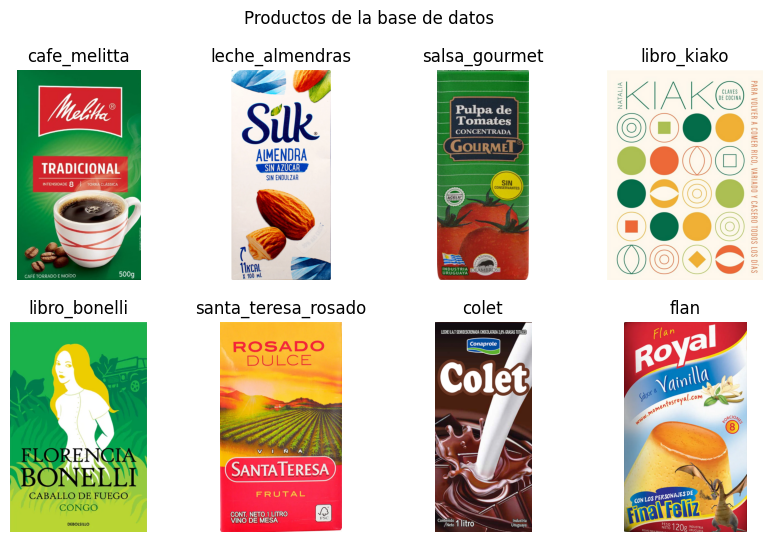

In [44]:
fig, ax = plt.subplots(2,4, figsize=(10,6))
ax = ax.flatten()
for i, nombre in enumerate(nombres_imagenes_base):
    path_img = os.path.join(dir_base_imagenes, f'productos/imagenes_base/{nombre}')
    img = cv2.imread(path_img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax[i].imshow(img)
    ax[i].axis('off')
    ax[i].set_title(nombre.split(".")[0])
plt.suptitle("Productos de la base de datos")
plt.show()

Reconociendo productos:

Reconociendo melitta_4.jpeg


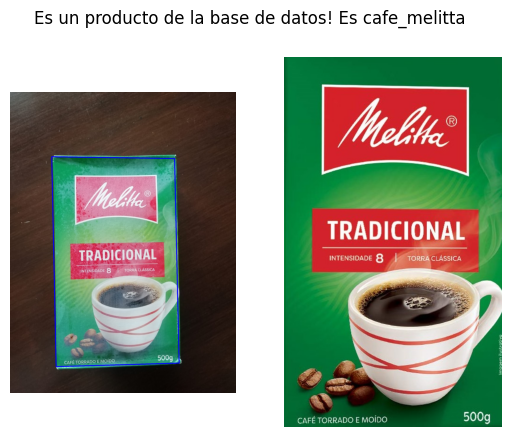

In [45]:
producto = "melitta_4.jpeg"
path_img = os.path.join(dir_base_imagenes, f'productos/imagenes_a_reconocer/{producto}')
print(f"Reconociendo {producto }")
reconocer_producto(path_img)

Reconociendo productos_2.jpeg


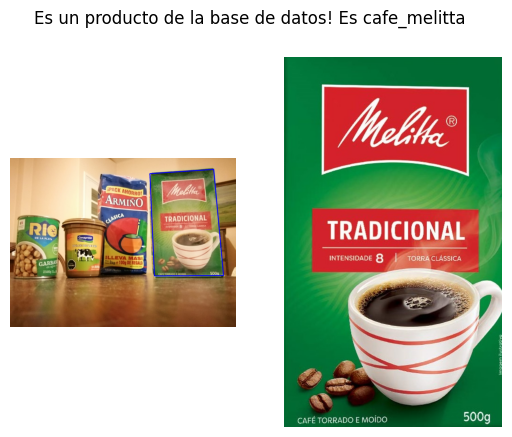

In [46]:
producto = "productos_2.jpeg"
path_img = os.path.join(dir_base_imagenes, f'productos/imagenes_a_reconocer/{producto}')
print(f"Reconociendo {producto }")
reconocer_producto(path_img)

Reconociendo leche_almendras.jpeg


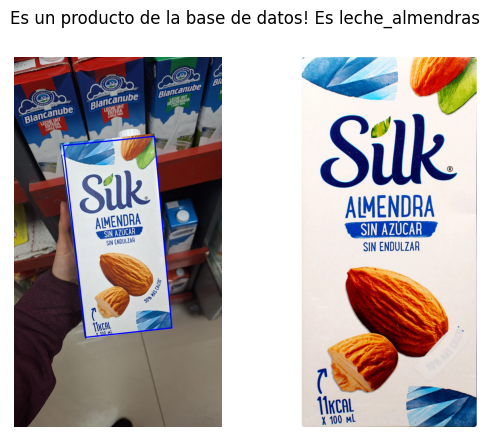

In [47]:
producto = "leche_almendras.jpeg"
path_img = os.path.join(dir_base_imagenes, f'productos/imagenes_a_reconocer/{producto}')
print(f"Reconociendo {producto }")
reconocer_producto(path_img)

Reconociendo flan.jpeg


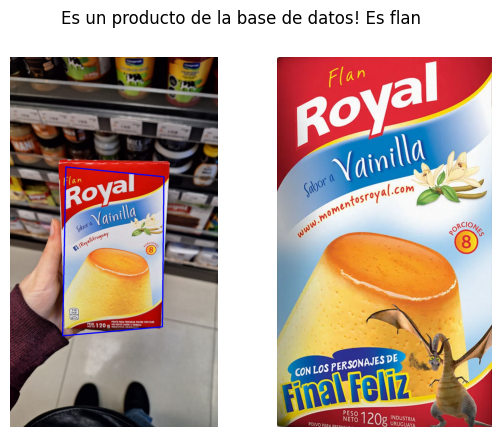

In [48]:
producto = "flan.jpeg"
path_img = os.path.join(dir_base_imagenes, f'productos/imagenes_a_reconocer/{producto}')
print(f"Reconociendo {producto }")
reconocer_producto(path_img)

Reconociendo fing.jpeg


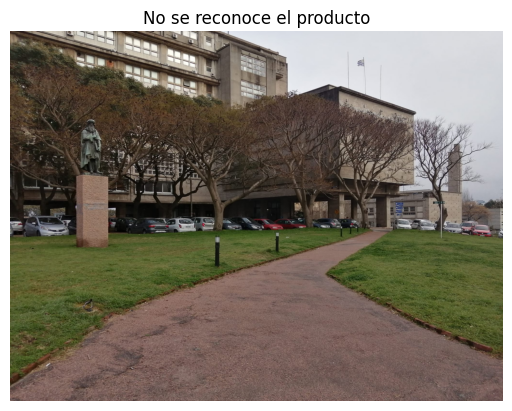

In [49]:
producto = "fing.jpeg"
path_img = os.path.join(dir_base_imagenes, f'productos/imagenes_a_reconocer/{producto}')
print(f"Reconociendo {producto }")
reconocer_producto(path_img)

Reconociendo libro_kiako.jpeg


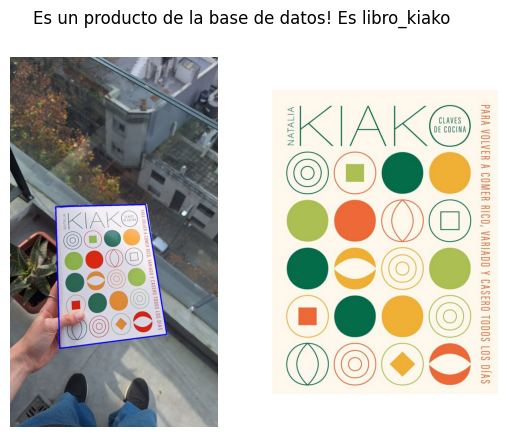

In [50]:
producto = "libro_kiako.jpeg"
path_img = os.path.join(dir_base_imagenes, f'productos/imagenes_a_reconocer/{producto}')
print(f"Reconociendo {producto }")
reconocer_producto(path_img)

Reconociendo libro_bonelli.jpeg


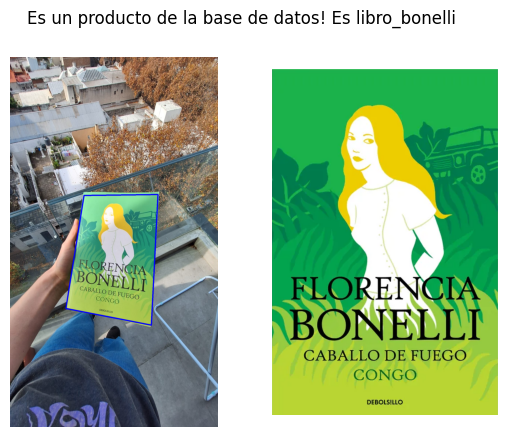

In [51]:
producto = "libro_bonelli.jpeg"
path_img = os.path.join(dir_base_imagenes, f'productos/imagenes_a_reconocer/{producto}')
print(f"Reconociendo {producto }")
reconocer_producto(path_img)

Reconociendo libros2_.jpeg


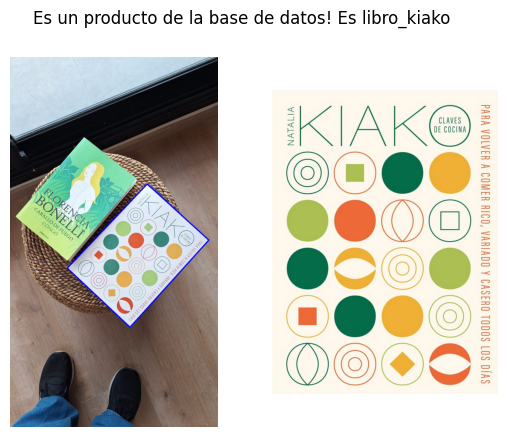

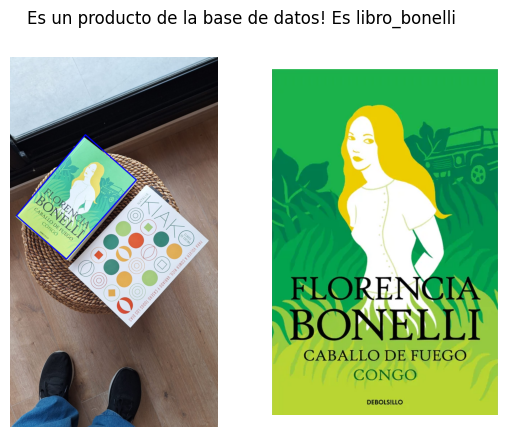

In [52]:
producto = "libros2_.jpeg"
path_img = os.path.join(dir_base_imagenes, f'productos/imagenes_a_reconocer/{producto}')
print(f"Reconociendo {producto }")
reconocer_producto(path_img)

Reconociendo libros.jpeg


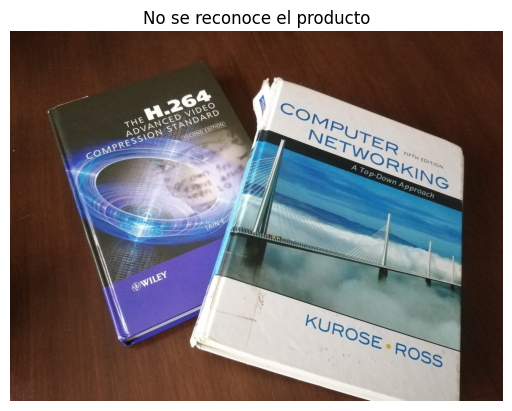

In [53]:
producto = "libros.jpeg"
path_img = os.path.join(dir_base_imagenes, f'productos/imagenes_a_reconocer/{producto}')
print(f"Reconociendo {producto }")
reconocer_producto(path_img)

Reconociendo mueble_cuadro.jpeg


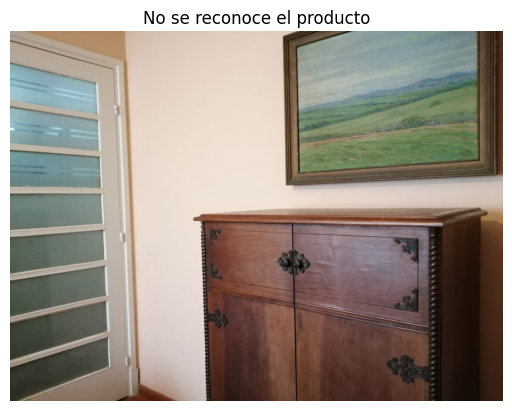

In [54]:
producto = "mueble_cuadro.jpeg"
path_img = os.path.join(dir_base_imagenes, f'productos/imagenes_a_reconocer/{producto}')
print(f"Reconociendo {producto }")
reconocer_producto(path_img)

Reconociendo colet.jpeg


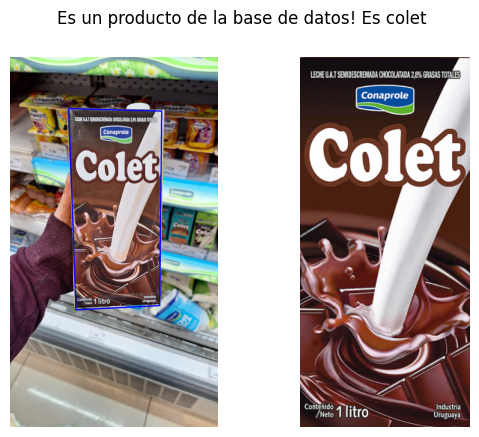

In [55]:
producto = "colet.jpeg"
path_img = os.path.join(dir_base_imagenes, f'productos/imagenes_a_reconocer/{producto}')
print(f"Reconociendo {producto }")
reconocer_producto(path_img)

Reconociendo santa_teresa_rosado.jpeg


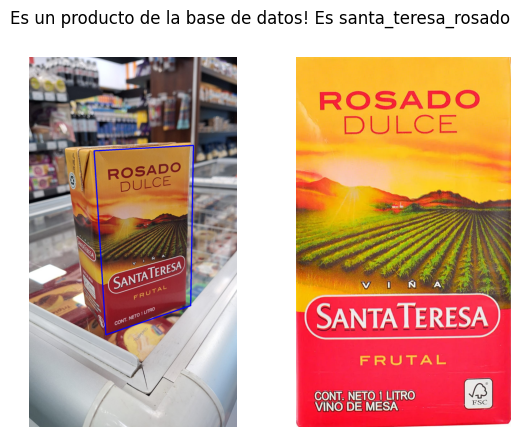

In [56]:
producto = "santa_teresa_rosado.jpeg"
path_img = os.path.join(dir_base_imagenes, f'productos/imagenes_a_reconocer/{producto}')
print(f"Reconociendo {producto }")
reconocer_producto(path_img)